# INEGI

Para este analsis usaremos la API de INEGI en este caso de la pagina del DENUE, que es el Directorio Estadístico Nacional de Unidades Económicas.

El cual extreremos informacion de los comercios marcados en este estado, ver que predomina en Morelos y en que municipios.

Contenido:

* Extracción de datos
* Limpieza de datos
* Análisis exploratorio (EDA)
* Visualización de datos
* Vizualización geoespacial
* agrupaciones
* Dash interactivo referente a los estratos segmentados por: Menudeo, Mayore, Restaurantes y Otros 
* Conclusiones


In [1]:
import pandas as pd 
import requests
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

import folium
from folium import plugins
from folium.plugins import MarkerCluster

import warnings
# Ignorar advertencias específicas
warnings.simplefilter(action='ignore', category=FutureWarning)

In [2]:
# Tu clave de API del INEGI
api_key = 'Quite mi clave API por seguridad pero aqui iria si alguien desea probar el codigo' 

# Código de estado
estado_cdmx = '17'

# URL para obtener todas las unidades económicas de la Ciudad de México
url = f"https://www.inegi.org.mx/app/api/denue/v1/consulta/BuscarEntidad/todos/{estado_cdmx}/1/10000000/{api_key}"

# Realizar la solicitud GET a la API
response = requests.get(url)

# Verificar si la solicitud fue exitosa
if response.status_code == 200:
    # Convertir la respuesta JSON a un DataFrame de pandas
    data = response.json()
    df = pd.DataFrame(data)  # Ajustar según la estructura de la respuesta JSON
    print('Se obtuvieron los datos exitosamente')
else:
    print(f'Error en la solicitud: {response.status_code}')


Se obtuvieron los datos exitosamente


In [3]:
# Definir el orden de los estratos
estrato_order = [
    '0 a 5 personas', 
    '6 a 10 personas', 
    '11 a 30 personas', 
    '31 a 50 personas', 
    '51 a 100 personas', 
    '101 a 250 personas', 
    '251 y más personas'
]

# Convertir la columna 'Estrato' a una categoría ordenada
df['Estrato'] = pd.Categorical(df['Estrato'], categories=estrato_order, ordered=True)


In [4]:
# Ordenar el DataFrame por 'Estrato'
df = df.sort_values('Estrato')


In [5]:
def CleanData(data):
    data.drop(columns=['CLEE','Num_Interior', 'Telefono', 'Correo_e', 'Sitio_internet', 'Tipo'], inplace=True)
    # Reemplazar cadenas vacías por NaN
    data.replace('', np.nan, inplace=True)

    # Eliminar columnas con más del 30% de valores faltantes
    threshold = 0.3 * len(data)
    data = data.dropna(axis=1, thresh=threshold)
    
    # Rellenar valores faltantes en 'Colonia' con un valor por defecto
    data.loc[:, 'Colonia'] = data['Colonia'].fillna('Desconocido')
    
    # Opcional: Rellenar 'Num_Exterior' con un valor por defecto
    data.loc[:, 'Num_Exterior'] = data['Num_Exterior'].fillna('N/A')
    
    # Opcional: Rellenar 'CP' con un valor por defecto o la moda (valor más frecuente)
    data.loc[:, 'CP'] = data['CP'].fillna(data['CP'].mode()[0])
    
    return data

In [6]:
def AdjustDataTypes(data):
    # Convertir columnas numéricas
    data['Latitud'] = data['Latitud'].astype(float)
    data['Longitud'] = data['Longitud'].astype(float)
    
    # Convertir CP a string
    data['CP'] = data['CP'].astype(str)
    
    # Convertir Num_Exterior a string
    data['Num_Exterior'] = data['Num_Exterior'].astype(str)
    
    # Convertir columnas categóricas a category
    categorical_columns = ['Clase_actividad', 'Estrato', 'Tipo_vialidad']
    for col in categorical_columns:
        data[col] = data[col].astype('category')
    
    return data

In [7]:
df = CleanData(df)
df = AdjustDataTypes(df)

In [8]:
df

,Id,Nombre,Clase_actividad,Estrato,Tipo_vialidad,Calle,Num_Exterior,Colonia,CP,Ubicacion,Longitud,Latitud
111840,2779268,ZYANYA,Comercio al por menor de regalos,0 a 5 personas,CALLE,REVOLUCION,7,BENITO JUAREZ LAGUNILLA,62037,"CUERNAVACA, Cuernavaca, MORELOS",-99.239904,18.902625
67074,8614287,PANADERIA BOCATA,Panificación tradicional,0 a 5 personas,CALLE,VERACRUZ,11,LAS PALMAS,62050,"CUERNAVACA, Cuernavaca, MORELOS",-99.233243,18.907481
67073,2781224,PANADERIA BOCADILLOS MANA,Comercio al por menor de otros alimentos,0 a 5 personas,CALLE,SONORA,5,JOYA DE LOS JILGEROS,62382,"CUERNAVACA, Cuernavaca, MORELOS",-99.190254,18.928685
67072,8678326,PANADERIA BLANCA,Panificación tradicional,0 a 5 personas,CALLE,CARLOS PACHECO,135,VICENTE ESTRADA CAJIGAL,62730,"YAUTEPEC DE ZARAGOZA, Yautepec, MORELOS",-99.066182,18.898186
67071,2850829,PANADERIA BETYS,Panificación tradicional,0 a 5 personas,AVENIDA,IGNACIO ZARAGOZA,8,JUMILTEPEC,62850,"JUMILTEPEC, Ocuituco, MORELOS",-98.775061,18.914326
...,...,...,...,...,...,...,...,...,...,...,...,...
98099,6361105,TOKAI DE MEXICO,Otras industrias manufactureras,251 y más personas,CALLE,56 SUR,N/A,CIVAC,62578,"JIUTEPEC, Jiutepec, MORELOS",-99.167375,18.910398
23245,6361167,CENTRO ASTURIANO DE MEXICO CLUB CAMPESTRE ECOL...,Clubes deportivos del sector privado,251 y más personas,OTRO(ESPECIFIQUE),NINGUNO,N/A,CENTRO ASTURIANO DE MEXICO,62845,"CENTRO ASTURIANO DE MÉXICO, Atlatlahucan, MORELOS",-98.868333,18.976389
75692,6741202,PRODUCTOS DIFO,"Elaboración de dulces, chicles y productos de ...",251 y más personas,CARRETERA,CARRETERA XOXOCOTLA-TEQUESQUITENGO 1.5,N/A,XOXOCOTLA,62670,"XOXOCOTLA CENTRO, Xoxocotla, MORELOS",-99.251960,18.680898
82492,6851807,SEARS CUERNAVACA AVERANDA,Comercio al por menor en tiendas departamentales,251 y más personas,CARRETERA,AUTOPISTA MÉXICO-ACAPULCO,102,RICARDO FLORES MAGON,62373,"CUERNAVACA, Cuernavaca, MORELOS",-99.199205,18.933135


# Analisis exploratorio (EDA)


In [ ]:
# Crear un mapa centrado en el promedio de las coordenadas
mapa = folium.Map(location=[df['Latitud'].mean(), df['Longitud'].mean()], zoom_start=10)

# Crear un clúster de marcadores
marker_cluster = MarkerCluster().add_to(mapa)

# Añadir marcadores al clúster
for idx, row in df.iterrows():
    folium.Marker(
        location=[row['Latitud'], row['Longitud']],
        popup=f"{row['Nombre']}: {row['Clase_actividad']}",
        tooltip=row['Nombre']
    ).add_to(marker_cluster)
# mapa

![Captura de pantalla 2024-06-07 235629.png](<attachment:Captura de pantalla 2024-06-07 235629.png>)
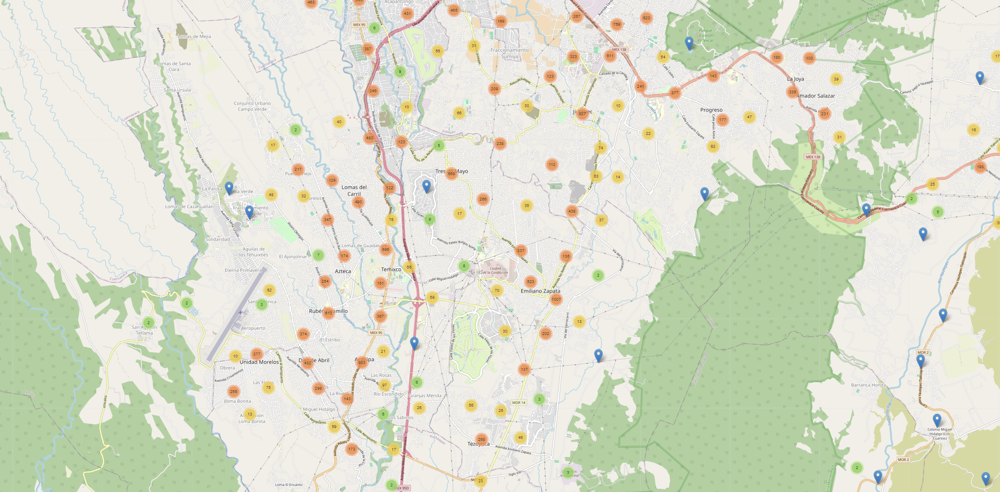

Eso imprime 'mapa', pongo la foto y comento ya que la ser un mapa interactivo revasa los mb para subir el repositorio a github

* CLEE: Clave única del establecimiento en el sistema del INEGI
* Id: Identificador del registro en la base de datos del INEGI
* Nombre: Nombre comercial del establecimiento
* Clase_actividad: Clase de actividad económica del establecimiento (por ejemplo, comercio al por menor de lentes, servicios de administración de carreteras, etc)
* Estrato: Tamaño del establecimiento en términos del número de empleados (por ejemplo, 0 a 5 personas, 6 a 10 personas, etc)
* Tipo_vialidad: Tipo de vialidad donde se encuentra el establecimiento (por ejemplo, avenida, calle, etc)
* Calle: Nombre de la calle donde se encuentra el establecimiento
* Num_Exterior: Número exterior del establecimiento
* Colonia: Nombre de la colonia donde se encuentra el establecimiento
* CP: Código postal del establecimiento
* Ubicacion: Ciudad, municipio y estado donde se encuentra el establecimiento
* Tipo: Tipo de teléfono del establecimiento (por ejemplo, fijo, móvil, etc)
* Longitud: Coordenada de longitud del establecimiento
* Latitud: Coordenada de latitud del establecimiento

In [9]:
# Filtrar actividades que comienzan con 'Comercio al por menor' y 'Comercio al por mayor'
comercio_menor = df[df['Clase_actividad'].str.startswith('Comercio al por menor')]
comercio_mayor = df[df['Clase_actividad'].str.startswith('Comercio al por mayor')]

# Contar las 20 actividades más comunes
top_comercio_menor = comercio_menor['Clase_actividad'].str.replace('Comercio al por menor de ', '').value_counts().nlargest(20)
top_comercio_mayor = comercio_mayor['Clase_actividad'].str.replace('Comercio al por mayor de ', '').value_counts().nlargest(20)

In [10]:
# Función para agregar etiquetas de valor en las barras
def add_value_labels(ax, spacing=5):
    for rect in ax.patches:
        x_value = rect.get_width()
        y_value = rect.get_y() + rect.get_height() / 2
        space = spacing
        label = f"{int(x_value)}"
        ax.annotate(
            label,
            (x_value, y_value),
            xytext=(space, 0),
            textcoords="offset points",
            va='center', ha='left')


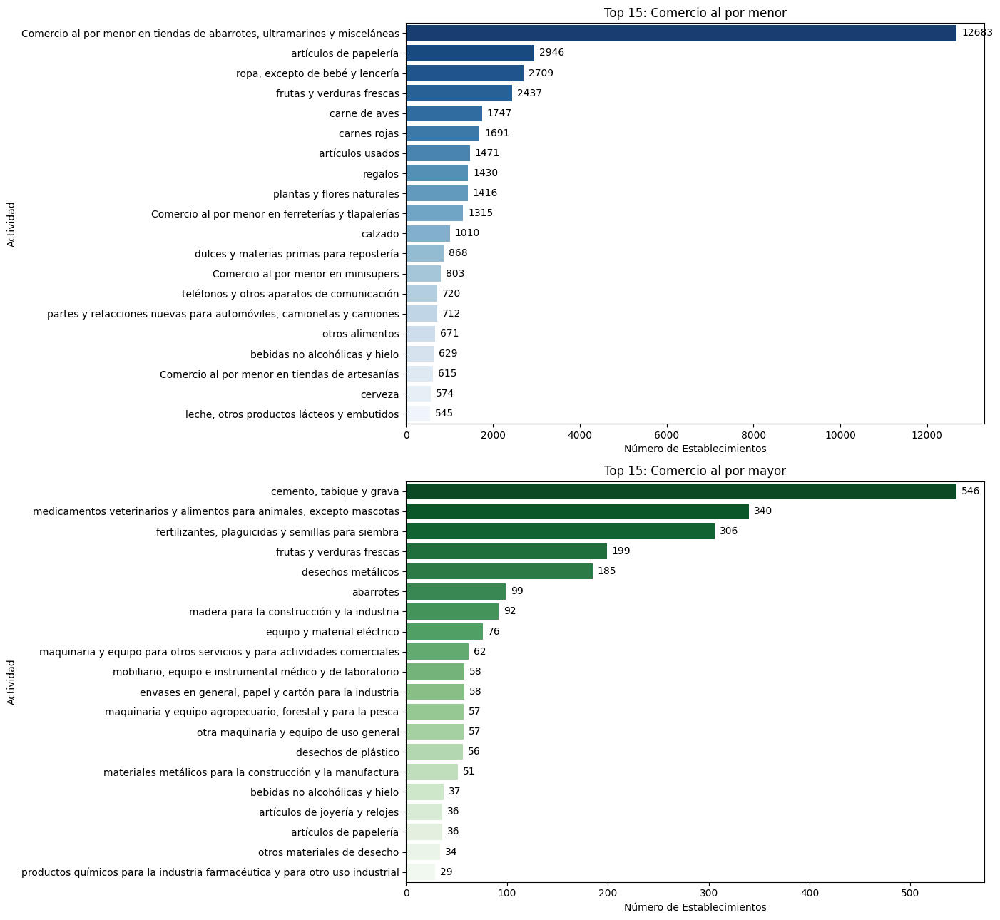

In [11]:
# Crear subplots
fig, axs = plt.subplots(2, 1, figsize=(14, 13))

# Graficar Comercio al por menor
colors_menor = sns.color_palette('Blues', n_colors=len(top_comercio_menor))
sns.barplot(x=top_comercio_menor.values, y=top_comercio_menor.index, ax=axs[0], palette=colors_menor[::-1], hue=top_comercio_menor.index, dodge=False, legend=False)
axs[0].set_title('Top 15: Comercio al por menor')
axs[0].set_xlabel('Número de Establecimientos')
axs[0].set_ylabel('Actividad')
add_value_labels(axs[0])

# Graficar Comercio al por mayor
colors_mayor = sns.color_palette('Greens', n_colors=len(top_comercio_mayor))
sns.barplot(x=top_comercio_mayor.values, y=top_comercio_mayor.index, ax=axs[1], palette=colors_mayor[::-1], hue=top_comercio_mayor.index, dodge=False, legend=False)
axs[1].set_title('Top 15: Comercio al por mayor')
axs[1].set_xlabel('Número de Establecimientos')
axs[1].set_ylabel('Actividad')
add_value_labels(axs[1])

# Ajustar diseño
plt.tight_layout()
plt.show()

In [12]:
def filtrar_actividades(df):
    """
    Filtra el DataFrame para excluir ciertas actividades y crear diferentes subconjuntos.
    """
    df_sin_mayore_menudeo = df[~df['Clase_actividad'].str.startswith('Comercio al por menor') & ~df['Clase_actividad'].str.startswith('Comercio al por mayor')]
    df_sin_restaurantes = df_sin_mayore_menudeo[~df_sin_mayore_menudeo['Clase_actividad'].str.contains('Restaurantes')]
    df_sin_restaurantes = df_sin_restaurantes[~df_sin_restaurantes['Clase_actividad'].str.contains('Cafeterías')]
    df_sin_restaurantes = df_sin_restaurantes[~df_sin_restaurantes['Clase_actividad'].str.contains('Bares')]

    df_comercio = df[~df['Clase_actividad'].str.contains('Restaurantes') 
                        & ~df['Clase_actividad'].str.contains('Cafeterías') 
                        & ~df['Clase_actividad'].str.contains('Bares') 
                        & ~df['Clase_actividad'].str.contains('Comercio al por menor') 
                        & ~df['Clase_actividad'].str.contains('Comercio al por mayor')]

    df_restaurantes = df[df['Clase_actividad'].str.contains('Restaurantes') & ~df['Clase_actividad'].str.contains('Cafeterías') & ~df['Clase_actividad'].str.contains('Bares')]

    return df_sin_mayore_menudeo, df_comercio, df_restaurantes


In [13]:
def contar_y_graficar(df, titulo, top_n):
    """
    Cuenta las `top_n` actividades más comunes y las grafica. Devuelve el DataFrame `best`.
    """
    # Contar las actividades más comunes
    actividad_counts = df['Clase_actividad'].value_counts().reset_index()
    actividad_counts.columns = ['Clase_actividad', 'Count']

    # Tomar las `top_n` actividades más comunes
    best = actividad_counts.head(top_n)

    # Crear el gráfico de barras
    plt.figure(figsize=(12, 8))
    ax = sns.barplot(y='Clase_actividad', x='Count', data=best, palette='magma', order=best['Clase_actividad'])
    plt.title(titulo)
    plt.xlabel('Número de Establecimientos')
    plt.ylabel('Clase de Actividad')

    # Agregar etiquetas de valor en las barras
    add_value_labels(ax)
    plt.show()

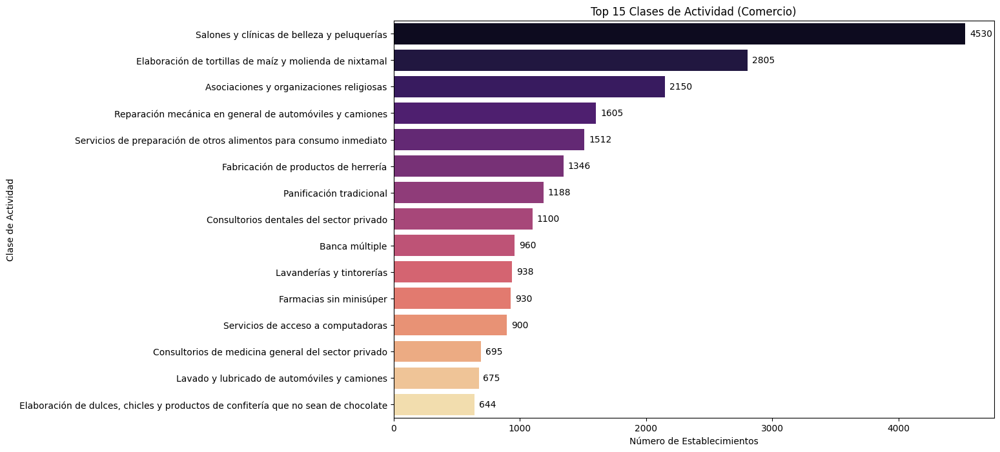

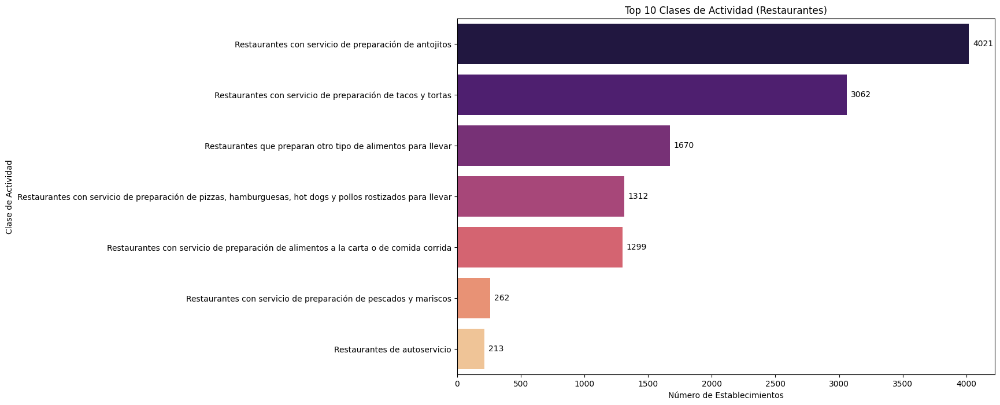

In [14]:
# Filtrar el DataFrame
df_sin_mayore_menudeo, df_comercio, df_restaurantes = filtrar_actividades(df)

# Contar y graficar las actividades más comunes
contar_y_graficar(df_comercio, 'Top 15 Clases de Actividad (Comercio)', 15)
contar_y_graficar(df_restaurantes, 'Top 10 Clases de Actividad (Restaurantes)', 7)

In [15]:

def visualizar_estratos(df):
    """
    Visualiza la distribución de los estratos en un gráfico de dispersión.
    """
    # Definir el orden de las categorías de estratos
    categoria_orden = ['0 a 5 personas', '6 a 10 personas', '11 a 30 personas', '31 a 50 personas', '51 a 100 personas', '101 a 250 personas', '251 y más personas']
    df['Estrato'] = pd.Categorical(df['Estrato'], categories=categoria_orden, ordered=True)

    # Crear el gráfico de dispersión
    plt.figure(figsize=(12, 8))
    ax = sns.scatterplot(data=df, x='Longitud', y='Latitud', hue='Estrato', size='Estrato', sizes=(20, 200), palette='viridis', alpha=0.6, edgecolor='w', legend='brief')
    plt.title('Distribución de Estratos en el Espacio Geográfico')
    plt.xlabel('Longitud')
    plt.ylabel('Latitud')
    plt.legend(title='Estrato')
    plt.show()


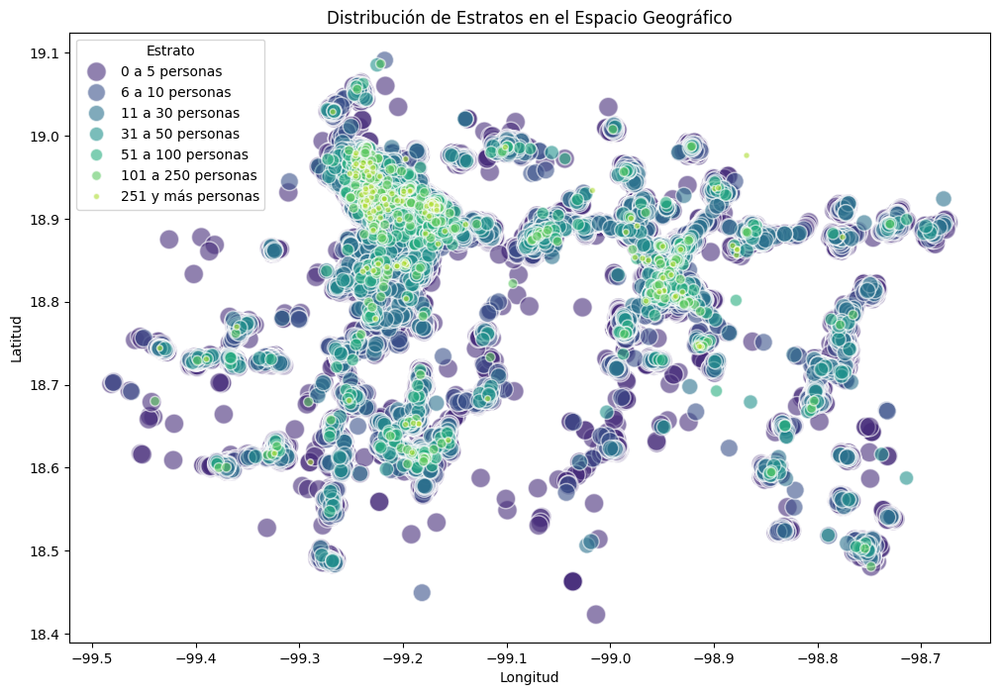

In [16]:
# Llamar a la función con tu DataFrame
visualizar_estratos(df)

# DASHBOARD

![Captura de pantalla 2024-06-07 232304.png](<attachment:Captura de pantalla 2024-06-07 232304.png>)
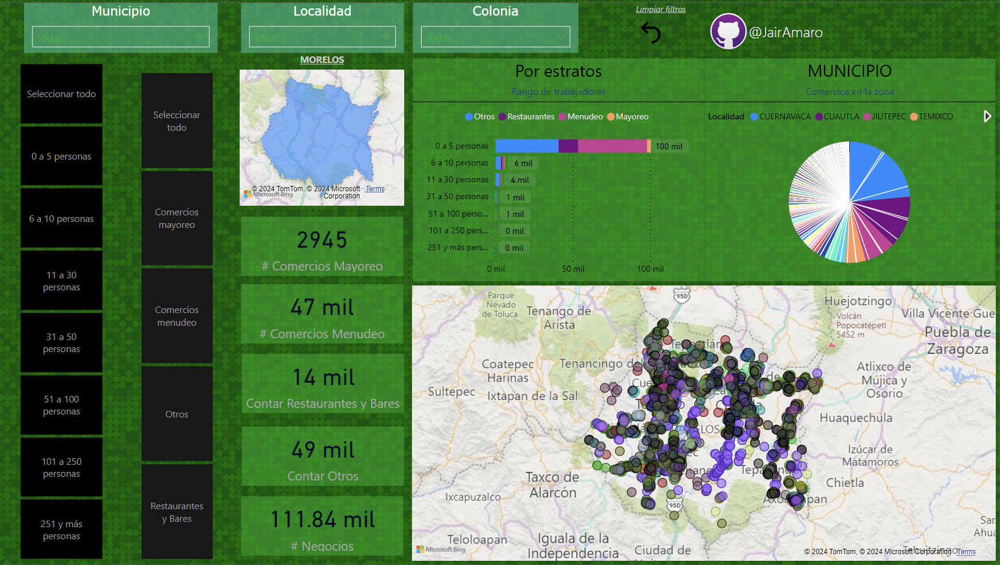

![Captura de pantalla 2024-06-07 232552.png](<attachment:Captura de pantalla 2024-06-07 232552.png>)
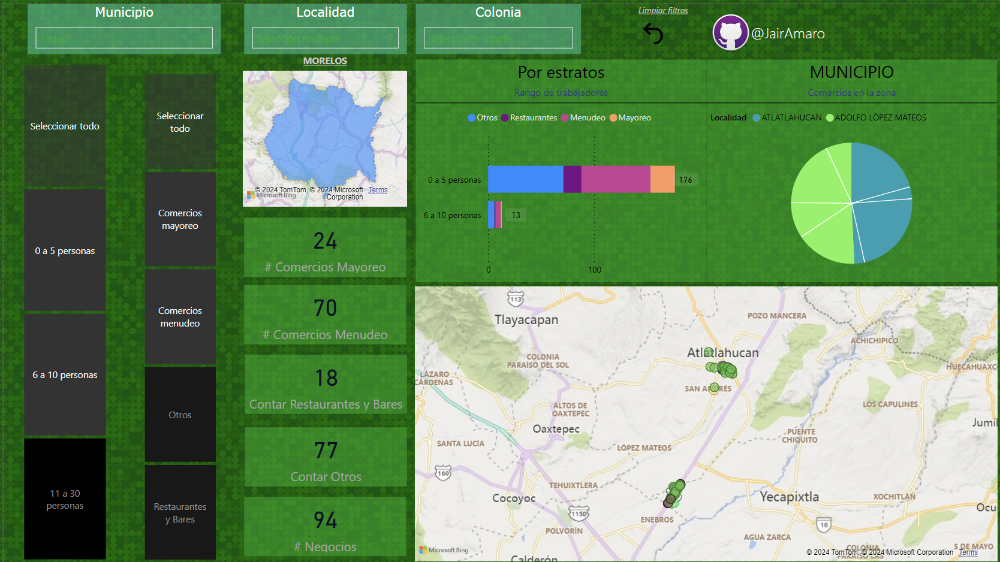

![Captura de pantalla 2024-06-07 233023.png](<attachment:Captura de pantalla 2024-06-07 233023.png>)
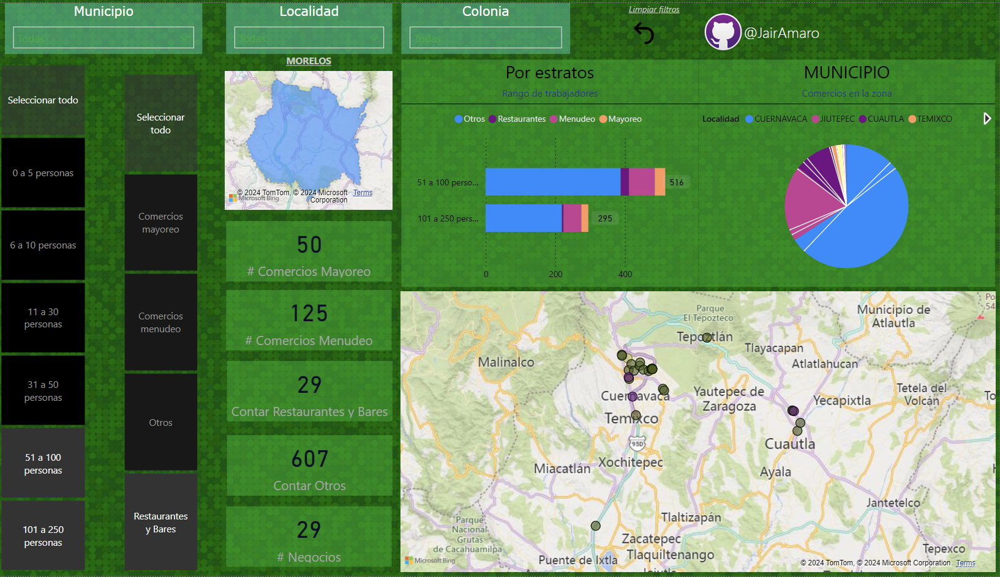

# Modelo

In [17]:
df_modelo = df.copy()

In [18]:
# Frecuencias de cada categoría en Clase_actividad
frecuencias = df_modelo['Clase_actividad'].value_counts()
proporciones = df_modelo['Clase_actividad'].value_counts(normalize=True)

In [19]:
frecuencias

Clase_actividad
Comercio al por menor en tiendas de abarrotes, ultramarinos y misceláneas                                  12683
Salones y clínicas de belleza y peluquerías                                                                 4530
Restaurantes con servicio de preparación de antojitos                                                       4021
Restaurantes con servicio de preparación de tacos y tortas                                                  3062
Comercio al por menor de artículos de papelería                                                             2946
                                                                                                           ...  
Edición y difusión de contenido exclusivamente a través de Internet y servicios de búsqueda en la red          1
Residencias del sector público para el cuidado de personas con problemas de trastorno mental y adicción        1
Elaboración de aceites y grasas vegetales comestibles                           

In [20]:
proporciones

Clase_actividad
Comercio al por menor en tiendas de abarrotes, ultramarinos y misceláneas                                  0.113402
Salones y clínicas de belleza y peluquerías                                                                0.040504
Restaurantes con servicio de preparación de antojitos                                                      0.035953
Restaurantes con servicio de preparación de tacos y tortas                                                 0.027378
Comercio al por menor de artículos de papelería                                                            0.026341
                                                                                                             ...   
Edición y difusión de contenido exclusivamente a través de Internet y servicios de búsqueda en la red      0.000009
Residencias del sector público para el cuidado de personas con problemas de trastorno mental y adicción    0.000009
Elaboración de aceites y grasas vegetales comestibles   

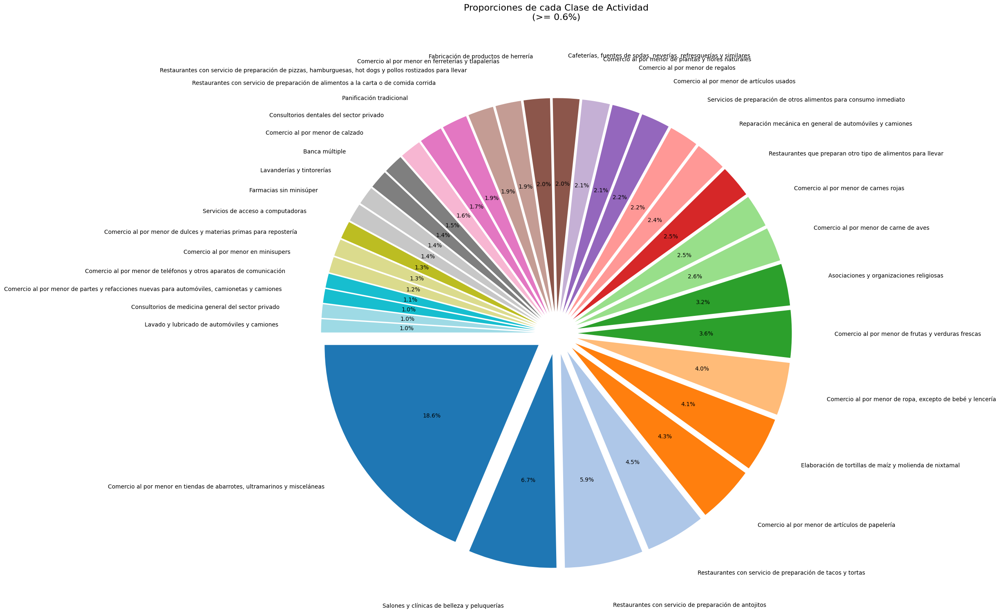

In [21]:
# Calcular las proporciones
proporciones = df_modelo['Clase_actividad'].value_counts(normalize=True)

# Filtrar las categorías con proporciones >= 0.6%
proporciones_filtradas = proporciones[proporciones >= 0.006]

# Crear una lista de valores para explotar las secciones del gráfico de pastel
explode = [0.1 if p >= 0.006 else 0 for p in proporciones_filtradas]

# Crear el gráfico de pastel
plt.figure(figsize=(17, 17))
proporciones_filtradas.plot.pie(autopct='%1.1f%%', startangle=180, cmap='tab20', explode=explode, labeldistance=1.2)
plt.title('Proporciones de cada Clase de Actividad\n(>= 0.6%)', fontsize=16, y=1.08)  
plt.ylabel('')  # Remover la etiqueta del eje y
plt.show()

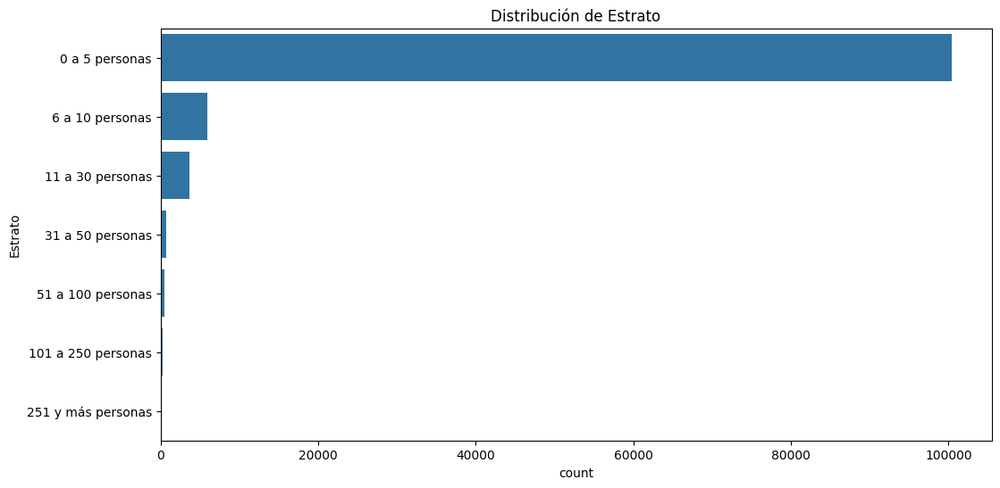

In [22]:
# Frecuencias de Estrato
frecuencias_estrato = df_modelo['Estrato'].value_counts()

# Visualización de la distribución de Estrato
plt.figure(figsize=(12, 6))
sns.countplot(y='Estrato', data=df_modelo, order=frecuencias_estrato.index)
plt.title('Distribución de Estrato')
plt.show()


In [23]:
from kmodes.kmodes import KModes
from sklearn.preprocessing import LabelEncoder

# Codificar las variables categóricas
df_encoded = df_modelo.apply(LabelEncoder().fit_transform)

# Selección de las variables para clustering
X = df_encoded[['Clase_actividad', 'Estrato', 'Tipo_vialidad', 'Colonia']]

# Aplicar K-Modes
kmodes = KModes(n_clusters=5, init='Huang', n_init=5, verbose=1)
clusters = kmodes.fit_predict(X)

# Agregar los clusters al DataFrame original
df_modelo['Cluster'] = clusters

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 941, cost: 221527.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 45876, cost: 217221.0
Run 2, iteration: 2/100, moves: 569, cost: 217221.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 33995, cost: 219389.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 4803, cost: 220155.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 2530, cost: 221316.0
Best run was number 2


In [24]:
# Crear un diccionario para almacenar los DataFrames de cada cluster
clusters_dict = {}

# Iterar sobre cada cluster único
for cluster in df_modelo['Cluster'].unique():
    cluster_data = df_modelo[df_modelo['Cluster'] == cluster]
    
    # Crear un DataFrame para el cluster
    cluster_df = pd.DataFrame({
        'Clase_actividad': cluster_data['Clase_actividad'].value_counts(),
        'Estrato': cluster_data['Estrato'].value_counts(),
        'Tipo_vialidad': cluster_data['Tipo_vialidad'].value_counts()
    }).fillna(0)
    
    # Guardar el DataFrame en el diccionario
    clusters_dict[f'Cluster_{cluster}'] = cluster_df

# Mostrar los DataFrames para cada cluster
for cluster_name, cluster_df in clusters_dict.items():
    print(f"\n{cluster_name}:\n", cluster_df)



Cluster_1:
                                                     Clase_actividad  Estrato  \
0 a 5 personas                                                  0.0  49171.0   
101 a 250 personas                                              0.0    136.0   
11 a 30 personas                                                0.0   1950.0   
251 y más personas                                              0.0     50.0   
31 a 50 personas                                                0.0    376.0   
...                                                             ...      ...   
Transporte turístico por tierra                                 3.0      0.0   
Tratamiento y disposición final de residuos no ...              1.0      0.0   
VIADUCTO                                                        0.0      0.0   
Venta de billetes de lotería, pronósticos depor...             20.0      0.0   
Órganos legislativos                                            1.0      0.0   

                          

In [25]:
cluster_0_df = clusters_dict['Cluster_0']
cluster_1_df = clusters_dict['Cluster_1']
cluster_2_df = clusters_dict['Cluster_2']
cluster_3_df = clusters_dict['Cluster_3']
cluster_4_df = clusters_dict['Cluster_4']

In [26]:
# Clase actividad se convierte en una valor numérico para no tener problemas pero en si se podria traducir al final que valor asignado tiene 0, 1, 2, 3, 4, ... n 
# donde n es el numero de clases de actividad que se tienen
cluster_0_df

,Clase_actividad,Estrato,Tipo_vialidad
0 a 5 personas,0.0,36696.0,0.0
101 a 250 personas,0.0,153.0,0.0
11 a 30 personas,0.0,1713.0,0.0
251 y más personas,0.0,77.0,0.0
31 a 50 personas,0.0,364.0,0.0
...,...,...,...
Transporte turístico por tierra,2.0,0.0,0.0
Tratamiento y disposición final de residuos no peligrosos por el sector privado,1.0,0.0,0.0
VIADUCTO,0.0,0.0,1.0
"Venta de billetes de lotería, pronósticos deportivos y otros boletos de sorteo",26.0,0.0,0.0


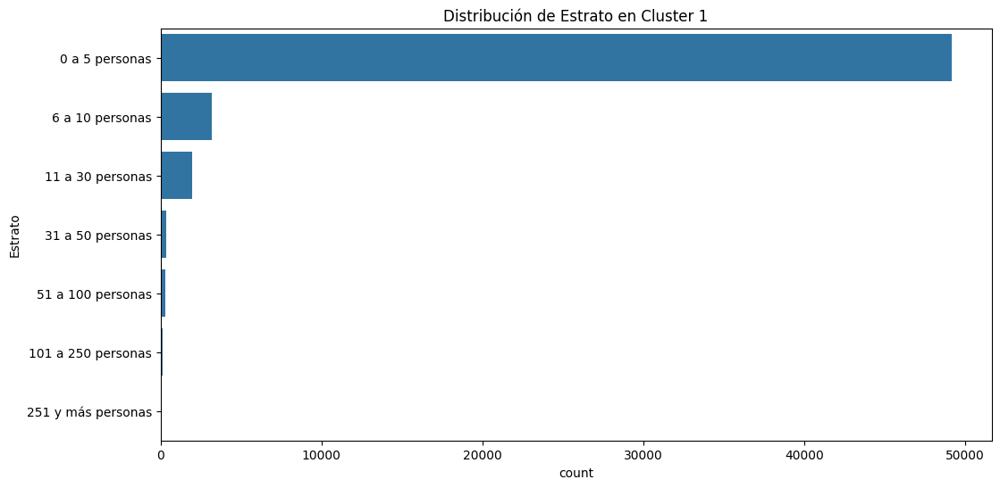

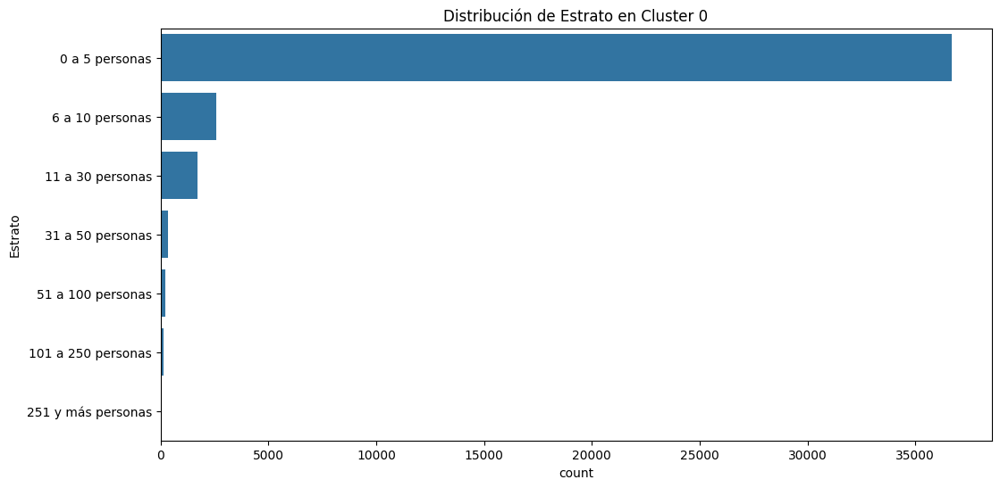

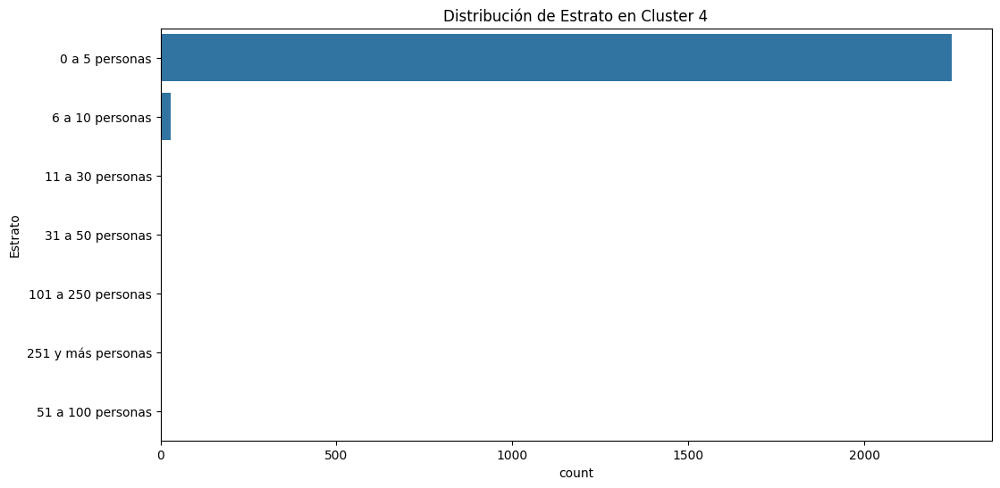

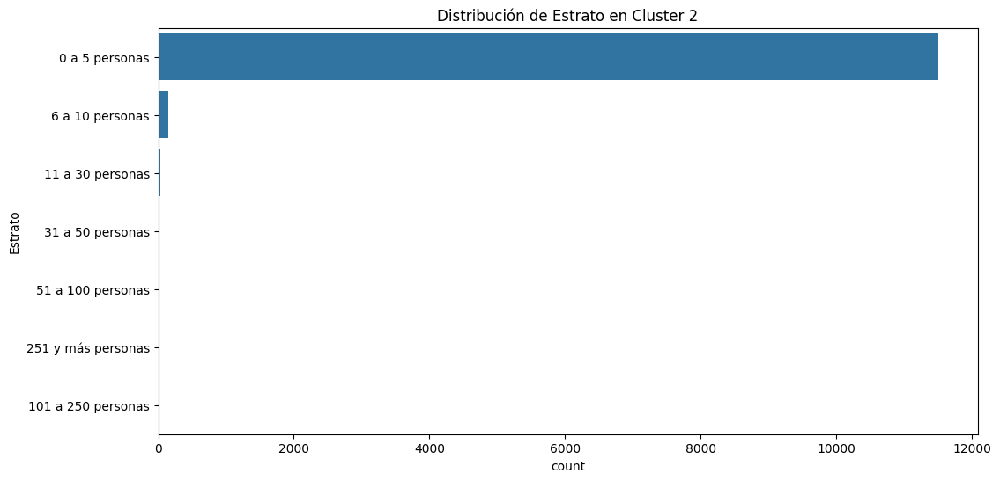

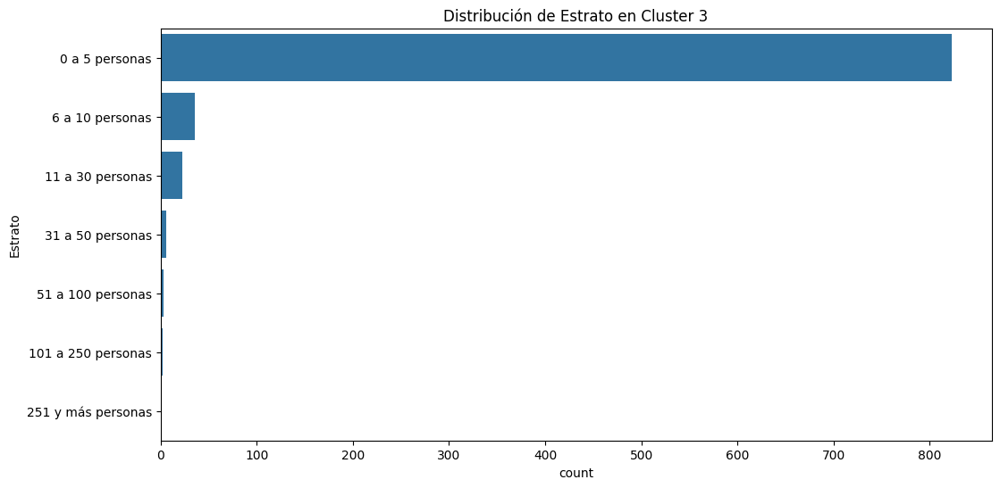

In [27]:
# Visualización de la distribución de Estrato por Cluster
for cluster in df_modelo['Cluster'].unique():
    plt.figure(figsize=(12, 6))
    cluster_data = df_modelo[df_modelo['Cluster'] == cluster]
    sns.countplot(y='Estrato', data=cluster_data, order=cluster_data['Estrato'].value_counts().index)
    plt.title(f'Distribución de Estrato en Cluster {cluster}')
    plt.show()


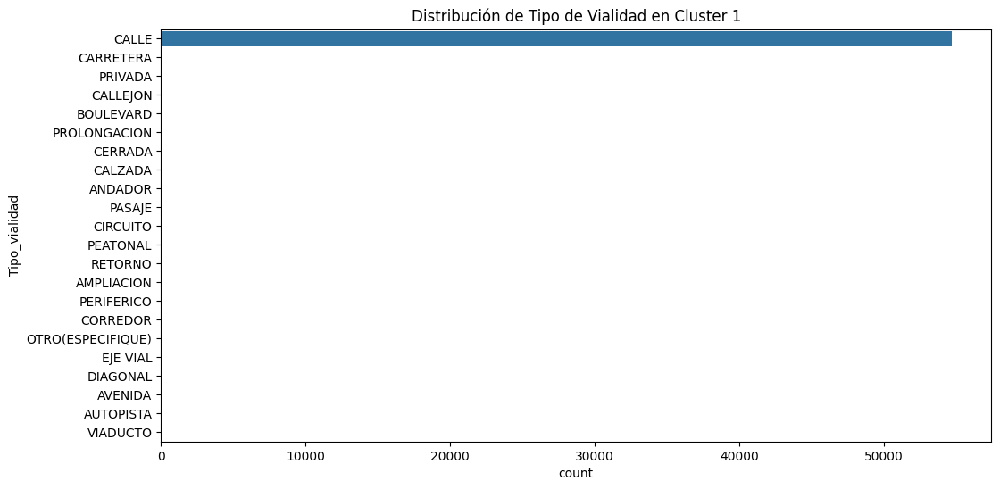

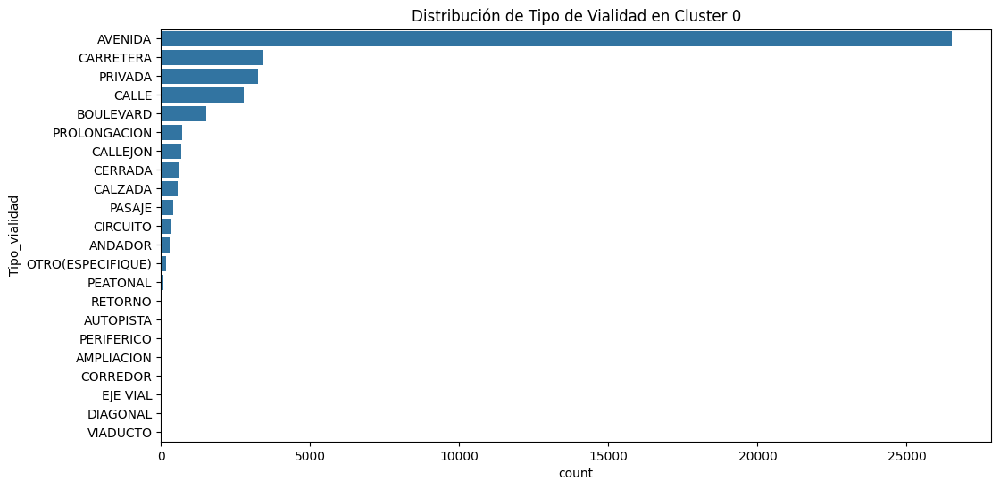

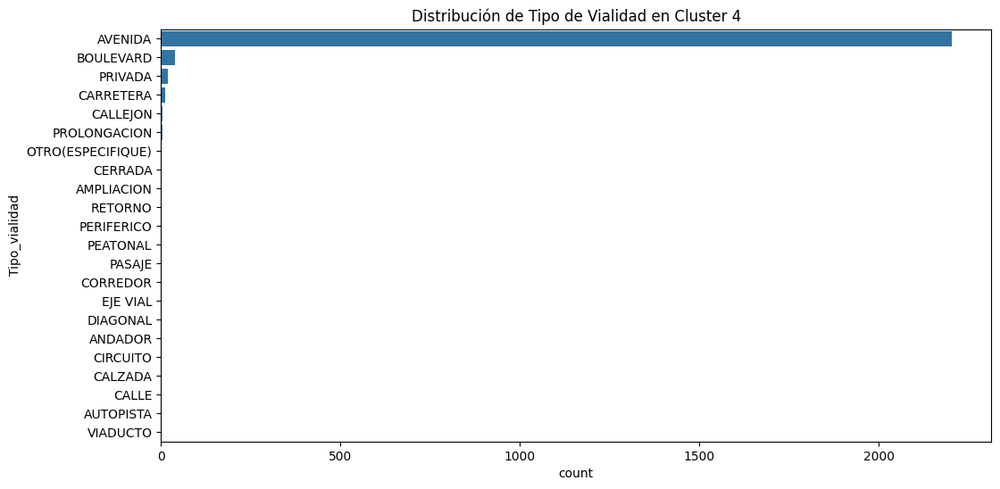

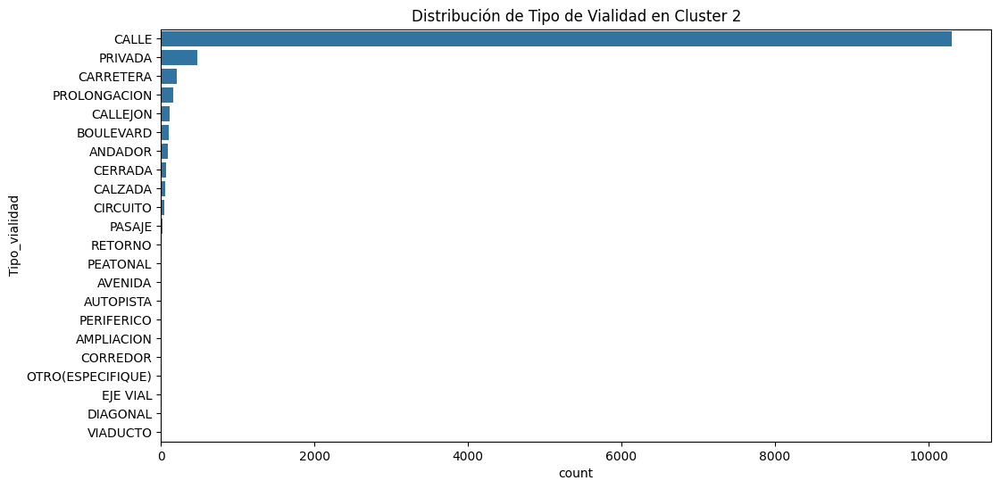

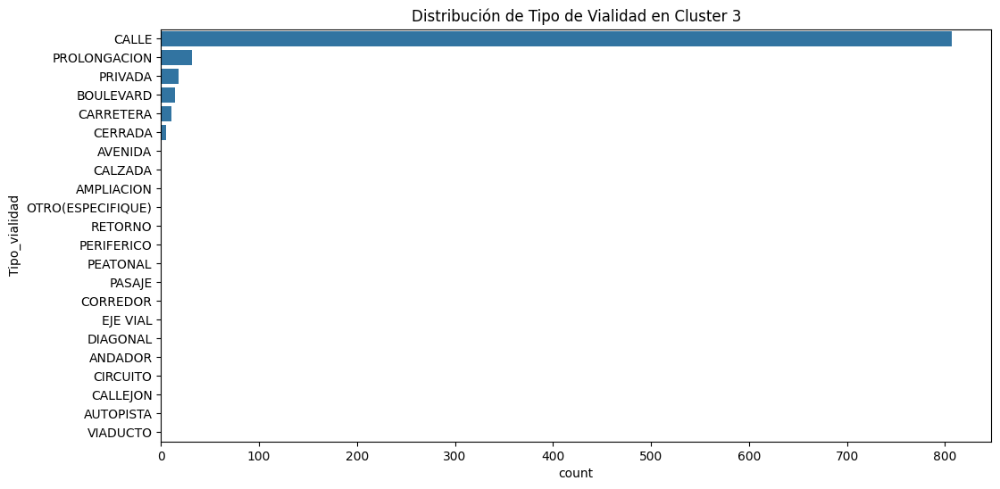

In [28]:
# Visualización de la distribución de Tipo de Vialidad por Cluster
for cluster in df_modelo['Cluster'].unique():
    plt.figure(figsize=(12, 6))
    cluster_data = df_modelo[df_modelo['Cluster'] == cluster]
    sns.countplot(y='Tipo_vialidad', data=cluster_data, order=cluster_data['Tipo_vialidad'].value_counts().index)
    plt.title(f'Distribución de Tipo de Vialidad en Cluster {cluster}')
    plt.show()

In [ ]:
import folium
from folium.plugins import MarkerCluster

# Crear un mapa centrado en Morelos
mapa = folium.Map(location=[18.9, -99.2], zoom_start=10)

# Definir colores para cada cluster
colors = ['red', 'blue', 'green', 'purple', 'orange']

# Agregar los comercios al mapa, coloreando por cluster
for cluster in df_modelo['Cluster'].unique():
    cluster_data = df_modelo[df_modelo['Cluster'] == cluster]
    marker_cluster = MarkerCluster().add_to(mapa)
    for index, row in cluster_data.iterrows():
        folium.Marker(location=[row['Latitud'], row['Longitud']],
                      popup=row['Clase_actividad'],
                      icon=folium.Icon(color=colors[cluster])).add_to(marker_cluster)
#mapa

Eso imprime 'mapa', pongo la foto y comento ya que la ser un mapa interactivo revasa los mb para subir el repositorio a github

![Captura de pantalla 2024-06-07 235445.png](<attachment:Captura de pantalla 2024-06-07 235445.png>)
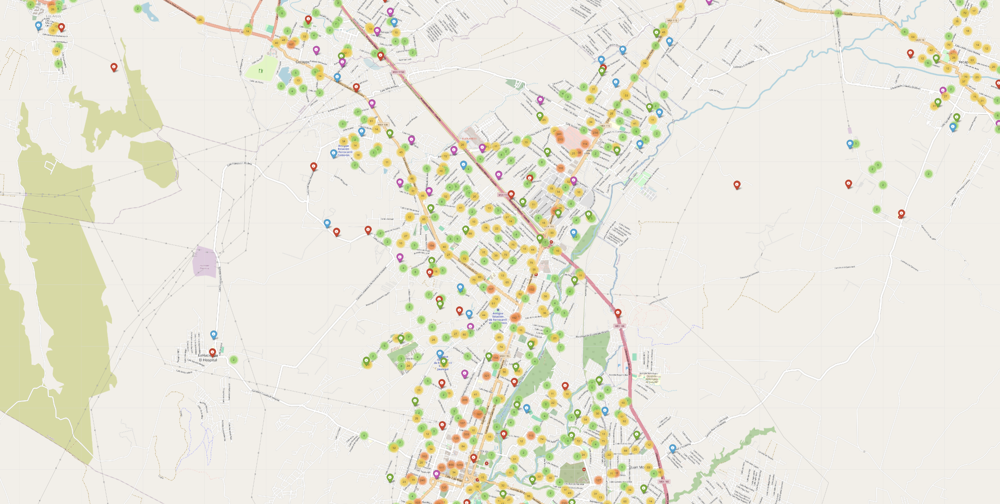

---

### Conclusiones del Análisis de Comercios en Morelos

#### Visualización Geoespacial

La visualización geoespacial muestra la distribución de los comercios en Morelos utilizando clusters diferenciados por colores. Cada color representa un cluster distinto, lo cual facilita la identificación de patrones geográficos y concentraciones de tipos de comercio en ciertas áreas.

#### Distribución de Tipo de Vialidad por Cluster

Los gráficos de barras de la distribución de tipo de vialidad por cluster revelan que:

- **Cluster 0**: Tiene una predominancia de comercios ubicados en calles, seguido de carreteras y privadas.

- **Cluster 1**: También muestra una predominancia de calles, pero con una mayor diversidad de tipos de vialidades.

- **Cluster 2**: Similar a los clusters anteriores, con una alta concentración en calles.

- **Cluster 3**: Menos diversificado, con predominancia clara en calles.

- **Cluster 4**: Presenta una mayor diversidad de tipos de vialidades, destacando avenidas y privadas.

#### Distribución de Estrato por Cluster

Los gráficos de barras de la distribución de estrato por cluster muestran:

- Clusters : predominan mas los negocios de 05 personas aun podriamos decir que en metricas seria de 0 30 personas, no suelen ser grandes comercios (hablando de empleados) ya que pueden ser negocios pequeños pero generan ingresos considerables

### Conclusión General

El análisis de los comercios en Morelos revela que la mayoría de los comercios están ubicados en calles y pertenecen al estrato de 0 a 5 personas. Sin embargo, hay variaciones significativas en la diversidad de tipos de vialidades y estratos entre los diferentes clusters.

- **Concentración en calles**: La mayoría de los comercios están ubicados en calles, lo que puede indicar una preferencia por ubicaciones con mayor accesibilidad y visibilidad.
- **Pequeños comercios predominantes**: La mayoría de los comercios pertenecen al estrato de 0 a 5 personas, sugiriendo que los pequeños negocios son la columna vertebral del comercio en Morelos.
- **Diversidad en ciertos clusters**: Algunos clusters muestran una mayor diversidad en términos de tipo de vialidad y estratos, lo que puede indicar áreas con una mayor variedad de tipos de comercio y tamaños de negocio.

### Conclusión a Nivel Negocio para Morelos

Para los negocios en Morelos, este análisis proporciona varios insights clave:

1. **Ubicación Estratégica**: La predominancia de calles como ubicación para comercios sugiere que los negocios deben considerar establecerse en áreas con alta accesibilidad y visibilidad para maximizar su exposición y atraer más clientes.
2. **Fomento a Pequeños Negocios**: Dado que los pequeños comercios (0 a 5 personas) son la mayoría, se podrían implementar políticas y programas de apoyo para fortalecer este sector, ofreciendo financiamiento, capacitación y asesoramiento empresarial.
3. **Diversificación y Oportunidades**: Las áreas con mayor diversidad en tipo de vialidades y estratos presentan oportunidades para introducir nuevos tipos de negocios y expandir operaciones. Identificar estos clusters puede ayudar a los empresarios a localizar nichos de mercado no explotados.
4. **Desarrollo Urbano y Comercial**: Los resultados pueden guiar las decisiones de planificación urbana y comercial, facilitando la creación de zonas comerciales más eficientes y atractivas para diferentes tipos de negocios.

Estos hallazgos pueden ser valiosos para la planificación urbana, la identificación de oportunidades de mercado y la toma de decisiones estratégicas para el desarrollo económico en Morelos.


---
Observaciones:

Solo tomamos el estado de Morelos, claro, podríamos hacer este análisis sin contar el 18% que son los comercios al por menos, pero se debería con demás estados de la república si pasa lo mismo o no, por ejemplo, la ciudad de México tendrá empresas donde sea al menos el promedio de 5o empleado, así la idea sería de cada estado, pero esto ya seria big data y lo ideal sería usar herramientas como spark, polar etc

Pero es buen análisis para poder crear oportunidades en proyectos de emprendimiento, por ejemplo, si vemos que en Morelos hay muchos comercios de 0 a 5 empleados, podríamos hacer un proyecto de emprendimiento para ayudar a estos comercios a crecer, por ejemplo, con un sistema de ventas en línea, o un sistema de publicidad, o un sistema de gestión de inventarios

---

Gracias por leer este análisis
